## Base function(ignore it)

In [120]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
## as the name indicates, this file contains the functions that are used to stack images together
def stackImages(scale,imgArray):
    rows = len(imgArray)
    cols = len(imgArray[0])
    rowsAvailable = isinstance(imgArray[0], list)
    width = imgArray[0][0].shape[1]
    height = imgArray[0][0].shape[0]
    if rowsAvailable:
        for x in range ( 0, rows):
            for y in range(0, cols):
                if imgArray[x][y].shape[:2] == imgArray[0][0].shape [:2]:
                    imgArray[x][y] = cv2.resize(imgArray[x][y], (0, 0), None, scale, scale)
                else:
                    imgArray[x][y] = cv2.resize(imgArray[x][y], (imgArray[0][0].shape[1], imgArray[0][0].shape[0]), None, scale, scale)
                if len(imgArray[x][y].shape) == 2: imgArray[x][y]= cv2.cvtColor( imgArray[x][y], cv2.COLOR_GRAY2BGR)
        imageBlank = np.zeros((height, width, 3), np.uint8)
        hor = [imageBlank]*rows
        hor_con = [imageBlank]*rows
        for x in range(0, rows):
            hor[x] = np.hstack(imgArray[x])
        ver = np.vstack(hor)
    else:
        for x in range(0, rows):
            if imgArray[x].shape[:2] == imgArray[0].shape[:2]:
                imgArray[x] = cv2.resize(imgArray[x], (0, 0), None, scale, scale)
            else:
                imgArray[x] = cv2.resize(imgArray[x], (imgArray[0].shape[1], imgArray[0].shape[0]), None,scale, scale)
            if len(imgArray[x].shape) == 2: imgArray[x] = cv2.cvtColor(imgArray[x], cv2.COLOR_GRAY2BGR)
        hor= np.hstack(imgArray)
        ver = hor
    return ver
    
def otsu_thresholding_plot(image):

    # Load the image

    # Apply a binary threshold to distinguish dark and white regions

    # Experiment with the threshold value (e.g., 127) to find a good distinction
    ret, thresholded_otsu = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)

    # Count the number of white and dark pixels,still remember that the image is in binary form so 0 is black and 1 is white
    white_pixels = cv2.countNonZero(thresholded_otsu)
    dark_pixels = thresholded_otsu.size - white_pixels

    # Calculate the ratio
    ratio = dark_pixels / (white_pixels+dark_pixels) if white_pixels != 0 else 0

    # Display the results
    print(f"Dark pixels: {dark_pixels}")
    print(f"White pixels: {white_pixels}")
    print(f"Ratio (dark/white): {ratio:.2f}")
    print(f"Otsu's thresholding value: {ret}")
    return thresholded_otsu


def compare_between_bi_clahebi_adaptive(img_path):
    # Read the image
    image = cv2.imread(img_path)  # Replace with your image path

    # Convert to grayscale image
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply adaptive thresholding. The parameters blockSize and C need to be adjusted according to the image
    # blockSize: Size of the neighborhood (odd number, e.g., 11)
    # C: Constant to be subtracted from the mean or weighted mean (e.g., 2)
    adaptive_thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, 
                                            cv2.THRESH_BINARY_INV, 57, 2)

    area_fraction = cv2.countNonZero(adaptive_thresh) / adaptive_thresh.size
    print(f"Area fraction: {area_fraction:.2f}")
    ### comparision:
    binary = otsu_thresholding_plot(gray)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    clahe_img = clahe.apply(gray)
    clahe_binary=otsu_thresholding_plot(clahe_img)
    print(f'adaptive thresholding area fraction: {cv2.countNonZero(adaptive_thresh) / adaptive_thresh.size:.2f}')
    plt.figure(figsize=(10,8),dpi=300)
    plt.subplot(131)
    plt.imshow(binary,cmap='gray')
    plt.title('Binary Image')
    plt.subplot(132)
    plt.imshow(clahe_binary,cmap='gray')
    plt.title('CLAHE binary Image')
    plt.subplot(133)
    plt.imshow(adaptive_thresh,cmap='gray')
    plt.title('Adaptive Thresholding Image')

# Binary image process principle
## How computer store images
![Pixel](https://www.researchgate.net/profile/Shihab-Shawkat/publication/328828460/figure/fig14/AS:694959833362438@1542702744693/Figure-216-A-8-bit-grayscale-image-pixel-value-ranges-between-0-black.jpg)

Figure 0: image is a matrix, value in the matrix are the depth
![BitDepthCompared](https://www.projectorcentral.com/images/articles/BitDepthComparedgrayscale-600.jpg)

Figure 1: Comparison of bit-depth gradations (note: illustration limited to 8-bits due to web limitations)

![bitdepthdef](https://www.projectorcentral.com/images/articles/Fig1-BitDepthValues-600.jpg)

Figure 2 : the bitdepth is defined by $2^{bit}$ 8bit -> $2^{8} =256$


![ProjectorCentral 10-bit HDR Grayscale Pattern](https://www.projectorcentral.com/images/articles/RGB-Explained-600.jpg)

Figure 3: how color image has the color, instead of one channel, commonly we use three channel for the images stroage(e.g. RGB), and the image is the overlapping of the three channel's grey scale

## Why binary img
Binary images are digital images that consist of pixels with only two possible values, typically represented as black and white. They have several important applications and advantages in image processing and computer vision:

### Key Characteristics

- Each pixel is represented by a single bit - either 0 (black) or 1 (white)[1][5].
- Binary images are the simplest type of digital images[4].
- They can be efficiently stored as bitmaps (packed arrays of bits)[5].

### Advantages

- **Simplicity**: Binary images are easy to process, store, and analyze due to their simple two-state nature[1][4].

- **Small File Size**: A 640x480 binary image requires only 37.5 KiB of storage, making them efficient for transmission and storage[5].

- **Computational Efficiency**: Processing binary images requires less computational time and resources[2].

- **Noise Immunity**: Binary signals are unambiguous, providing resistance to noise in image processing[6].

- **Perfect Replication**: Binary data can be copied flawlessly without degradation[6].

### Applications

Binary images are used in various fields and applications, including:

1. **Optical Character Recognition (OCR)**: For separating text from backgrounds[1][2].

2. **Industrial Automation**: 
   - Quality control and defect detection (e.g., in printed circuit boards)[4].
   - Object detection on assembly lines[1].

3. **Medical Imaging**: 
   - Segmentation in X-rays, MRIs, and other medical scans[1][2].
   - Enhancing specific features in medical images[1].

4. **Biometrics**: 
   - Fingerprint recognition[1][4].
   - Iris recognition[2].

5. **Computer Vision Tasks**:
   - Edge detection[3].
   - Pattern recognition[1].
   - Object detection and tracking[1][2].

6. **Document Analysis**: Enhancing clarity of handwritten or printed text[1].

7. **Barcode and QR Code Scanning**: Simplifying recognition processes[1].

8. **Machine Vision**: Identifying objects on production lines[1].

Binary images, despite their simplicity, play a crucial role in various image processing tasks and serve as a foundation for more complex computer vision applications.

Citations:

[1] https://cloudinary.com/glossary/binary-image

[2] https://www.geeksforgeeks.org/binary-image/

[3] https://homepages.inf.ed.ac.uk/rbf/CVonline/LOCAL_COPIES/OWENS/LECT2/node3.html

[4] https://cave.cs.columbia.edu/Statics/monographs/Binary%20Images%20FPCV-1-3.pdf

[5] https://en.wikipedia.org/wiki/Binary_image

[6] https://computerscience.chemeketa.edu/cs160Reader/Binary/Binary.html

[7] https://www.v7labs.com/blog/image-processing-guide

### Hands On OpenCV Binary process
![opencvlog](https://upload.wikimedia.org/wikipedia/commons/thumb/3/32/OpenCV_Logo_with_text_svg_version.svg/360px-OpenCV_Logo_with_text_svg_version.svg.png)

#### what is Opencv

**There is no doubt, opencv is the library make your computer could observe the real world**

OpenCV is a cross-platform library that provides a comprehensive set of tools and functions for image and video processing, analysis, and manipulation. It was originally developed by Intel in 1999 and is now maintained by a community of developers under the OpenCV Foundation.
OpenCV is extremely important in the field of computer vision and image processing. 
### key steps of Binary process 
1. original img
2. convert to grey 8 bit img $2^8$ (0-255)
3. Set threshold for binary img conversion,
    - method1:**cv2.THRESH_BINARY** pixel value < TH --> 0
    - method2:**cv2.THRESH_BINARY_INV** pixel value < TH --> 1
4. optional process: you can add the blur process before step2 via Gaussian Blur filter to denoise the low frequency noise

![]

### For binary:
- simple binary img:**cv2.threshold**
    - stastic threshold and manually tunning.
    - Analysis the image histogram get the threshold --> otsu's method
    [otsu wiki][https://www.wikiwand.com/en/articles/Otsu's_method]
- adaptive binary (kernel: gaussian or mean):**cv2.adaptiveThreshold**
    - Why adaptive: tunning the threshold dynamically.
    - Dive into details: The adaptiveMethod decides how the threshold value is calculated: **cv.ADAPTIVE_THRESH_MEAN_C**: The threshold value is the mean of the neighbourhood area minus the constant C.**cv.ADAPTIVE_THRESH_GAUSSIAN_C**: The threshold value is a gaussian-weighted sum of the neighbourhood values minus the constant C.
The blockSize determines the size of the neighbourhood area and C is a constant that is subtracted from the mean or weighted sum of the neighbourhood pixels.

#### Further reference:
[Opencv_documentation](https://docs.opencv.org/4.x/d7/d4d/tutorial_py_thresholding.html)

[Opencv_application](https://viso.ai/computer-vision/opencv/)



### First the simple code for global threshold Binary img

Dark pixels: 154110
White pixels: 252162
Ratio (dark/white): 0.38


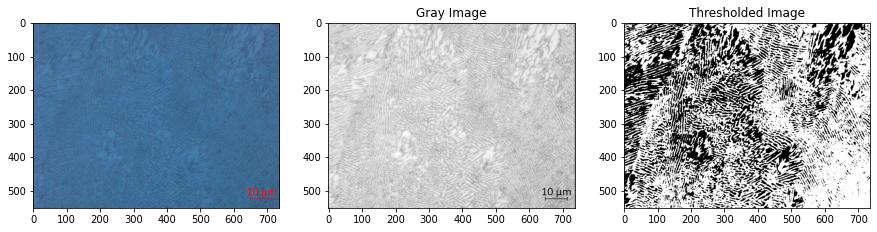

In [121]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

demonstrate_img = 'mutiple/B3-10um-50x.PNG'

# Load the image
image = cv2.imread(demonstrate_img) 

# Convert to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply a binary threshold to distinguish dark and white regions

# Experiment with the threshold value (e.g., 127) to find a good distinction
_, thresholded = cv2.threshold(gray, 120, 255, cv2.THRESH_BINARY_INV)

# Count the number of white and dark pixels,still remember that the image is in binary form so 0 is black and 1 is white
white_pixels = cv2.countNonZero(thresholded)
dark_pixels = thresholded.size - white_pixels

# Calculate the ratio
ratio = dark_pixels / (white_pixels+dark_pixels) if white_pixels != 0 else 0

# Display the results
print(f"Dark pixels: {dark_pixels}")
print(f"White pixels: {white_pixels}")
print(f"Ratio (dark/white): {ratio:.2f}")

#stackImage = stackImages(0.6, ([image, gray, thresholded]))
# Optionally, display the thresholded image
#plt.imshow(stackImage)
ax ,fig = plt.subplots(figsize=(15,10))
plt.subplot(131)
plt.imshow(image)
plt.subplot(132)
plt.imshow(gray,cmap='gray')
plt.title('Gray Image')
plt.subplot(133)
plt.imshow(thresholded,cmap='gray')
plt.title('Thresholded Image')
plt.show()


I have try my best to find a threshold value which looks good to me, but definitely it may not the best value

Dark pixels: 154110
White pixels: 252162
Ratio (dark/white): 0.38
Otsu's thresholding value: 116.0


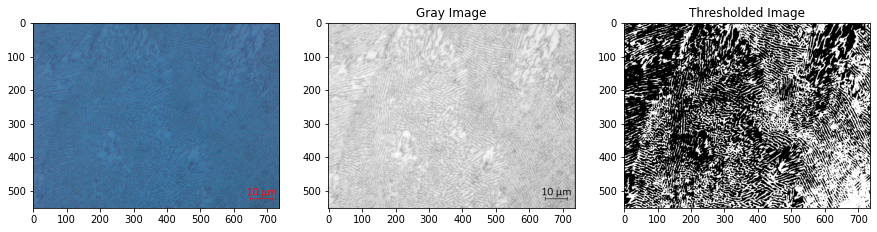

In [122]:
### using Otsu's thresholding


# Load the image
image = cv2.imread(demonstrate_img) 

# Convert to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply a binary threshold to distinguish dark and white regions

# Experiment with the threshold value (e.g., 127) to find a good distinction
ret, thresholded_otsu = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)

# Count the number of white and dark pixels,still remember that the image is in binary form so 0 is black and 1 is white
white_pixels = cv2.countNonZero(thresholded)
dark_pixels = thresholded.size - white_pixels

# Calculate the ratio
ratio = dark_pixels / (white_pixels+dark_pixels) if white_pixels != 0 else 0

# Display the results
print(f"Dark pixels: {dark_pixels}")
print(f"White pixels: {white_pixels}")
print(f"Ratio (dark/white): {ratio:.2f}")
print(f"Otsu's thresholding value: {ret}")
#stackImage = stackImages(0.6, ([image, gray, thresholded]))
# Optionally, display the thresholded image
#plt.imshow(stackImage)
ax ,fig = plt.subplots(figsize=(15,10))
plt.subplot(131)
plt.imshow(image)
plt.subplot(132)
plt.imshow(gray,cmap='gray')
plt.title('Gray Image')
plt.subplot(133)
plt.imshow(thresholded_otsu,cmap='gray')
plt.title('Thresholded Image')
plt.show()



### Now let's compare the difference between two methods

Text(0.5, 1.0, 'Thresholded Image with otsu')

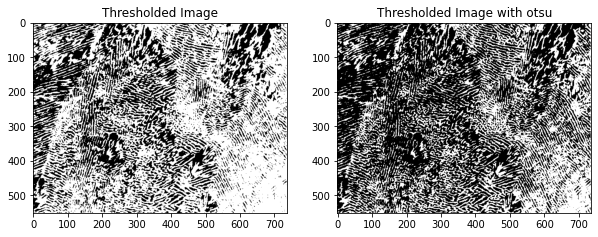

In [123]:
plt.figure(figsize=(10,5))
plt.subplot(121)
plt.imshow(thresholded,cmap='gray')
plt.title('Thresholded Image')
plt.subplot(122)
plt.imshow(thresholded_otsu,cmap='gray')
plt.title('Thresholded Image with otsu')

### Why otsu goes better:
lets visualize the threshold position in histogram of the grey img we have been already converted

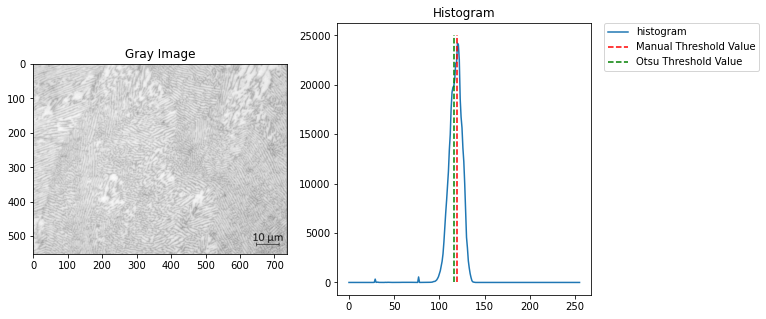

In [124]:
histSize = 256
histRange = (0, 256) 
accumulate = True
#a = cv2.calcHist([gray], [0], None, [256], histRange,accumulate=accumulate)
a = np.histogram(gray.ravel(),256,[0,256])[0]
plot = plt.figure(figsize=(10,5))
plt.subplot(121)
plt.imshow(gray,cmap='gray')
plt.title('Gray Image')
plt.subplot(122)
plt.plot(a,label='histogram')
plt.title('Histogram')
plt.vlines(120,0,25000,colors='r',linestyles='dashed',label='Manual Threshold Value')
plt.vlines(ret,0,25000,colors='g',linestyles='dashed',label='Otsu Threshold Value')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)


### Otsu'Method find the best threshold by anaylizing the histogram of the image

By walking through the image histogram,Otsu method is tring to searche for the threshold that minimizes the intra-class variance, defined as a weighted sum of variances of the two classes:
$$
\sigma_w^2(t)=\omega_0(t) \sigma_0^2(t)+\omega_1(t) \sigma_1^2(t)
$$
Weights $\omega_0$ and $\omega_1$ are the probabilities of the two classes separated by a threshold $t$, and $\sigma_0^2$ and $\sigma_1^2$ are variances of these two classes.


**For 2 classes**, minimizing the intra-class variance is equivalent to maximizing inter-class variance:

$$
\begin{aligned}
\sigma_b^2(t) & =\sigma^2-\sigma_w^2(t)=\omega_0(t)\left(\mu_0-\mu_T\right)^2+\omega_1(t)\left(\mu_1-\mu_T\right)^2 \\
& =\omega_0(t) \omega_1(t)\left[\mu_0(t)-\mu_1(t)\right]^2
\end{aligned}
$$


see the animation for how Otsu'method work:

![otsu'demo](https://upload.wikimedia.org/wikipedia/commons/thumb/3/34/Otsu%27s_Method_Visualization.gif/480px-Otsu%27s_Method_Visualization.gif)

Ref:
[Otsu wiki][https://www.wikiwand.com/en/articles/Otsu's_method]

## When will the Otsu fail

- The answer is that when the background lighting is uneven, it can indeed cause problems for almost all algorithms based on histogram analysis (pixel value). This uneven background introduces unexpected high-peak noise into the original image, which can lead to false analysis since the analysis is based on single pixel values. 

- Solution to uneven bk light
    - try to get a uniform bk img!!!! Most efficient
    - using algorithm: e.g. Rolling ball (a sets of expansion and errsion operation, but computational expensive) and many other
    - tunning local contrast
     - **CLAHE(enhance local contrast)**
    - adaptive threshold binary, this will be discussed in the next section.

### But first I will give you some strategies enhance your img outcome quality
- BK improvement:
 - **CLAHE(enhance local contrast)**
- Denoising:try add filters
    - **gaussian blur**
    - ersion,dilate
    - openning,close


Dark pixels: 148451
White pixels: 263729
Ratio (dark/white): 0.36
Otsu's thresholding value: 188.0
Dark pixels: 259922
White pixels: 152258
Ratio (dark/white): 0.63
Otsu's thresholding value: 203.0


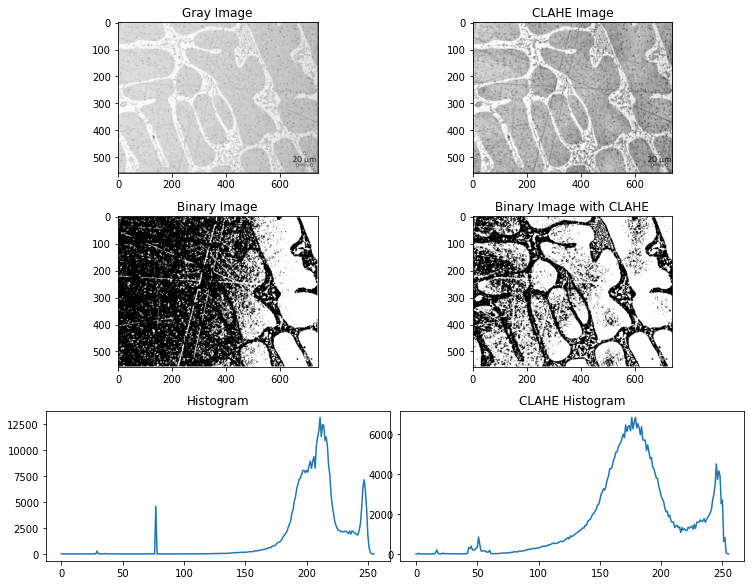

In [125]:
### CLAHE
# Load the image
img_path = 'mutiple/A8-20um-20x.PNG'
image = cv2.imread(img_path)
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
clahe=cv2.createCLAHE(clipLimit=2.0,tileGridSize=(8,8)) ### feel free to fine tune the parameters
clahe_img = clahe.apply(gray)
clahe_binary= otsu_thresholding_plot(clahe_img)
origin_binary = otsu_thresholding_plot(gray)



plt.figure(figsize=(10,8))
plt.subplot(321)
plt.imshow(gray,cmap='gray')
plt.title('Gray Image')
plt.subplot(322)
plt.imshow(clahe_img,cmap='gray')
plt.title('CLAHE Image')
plt.subplot(323)
plt.imshow(origin_binary,cmap='gray')
plt.title('Binary Image')
plt.subplot(324)
plt.imshow(clahe_binary,cmap='gray')
plt.title('Binary Image with CLAHE')
plt.tight_layout()
plt.subplot(325)
plt.plot(np.histogram(gray.ravel(),256,[0,256])[0],label='histogram')
plt.title('Histogram')
plt.subplot(326)
plt.plot(np.histogram(clahe_img.ravel(),256,[0,256])[0],label='histogram')
plt.title('CLAHE Histogram')


plt.show()



### From above you should find how CLAHE algorithm improved the uneven bk light img
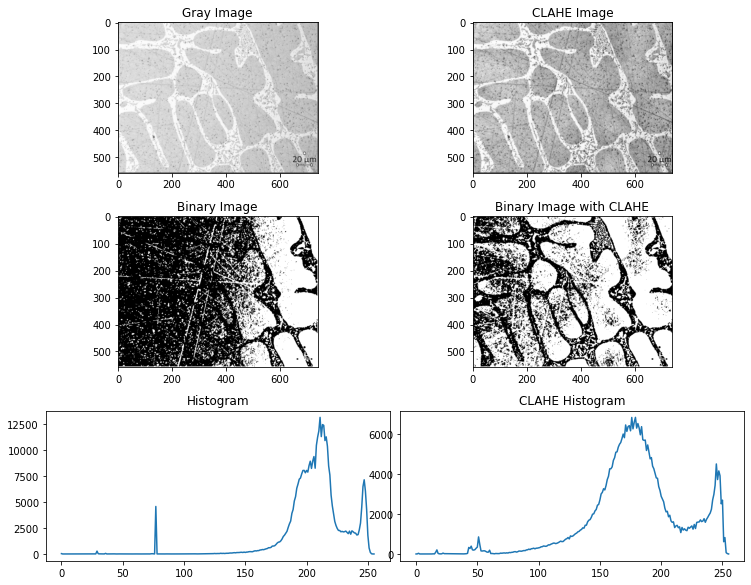

After CLAHE you will find the hist become wider and much more distinguishable

Original without any denoising
Dark pixels: 148451
White pixels: 263729
Ratio (dark/white): 0.36
Otsu's thresholding value: 188.0
After applying different denoising techniques
Dark pixels: 124184
White pixels: 287996
Ratio (dark/white): 0.30
Otsu's thresholding value: 191.0
Dark pixels: 107828
White pixels: 304352
Ratio (dark/white): 0.26
Otsu's thresholding value: 196.0
Dark pixels: 127532
White pixels: 284648
Ratio (dark/white): 0.31
Otsu's thresholding value: 190.0


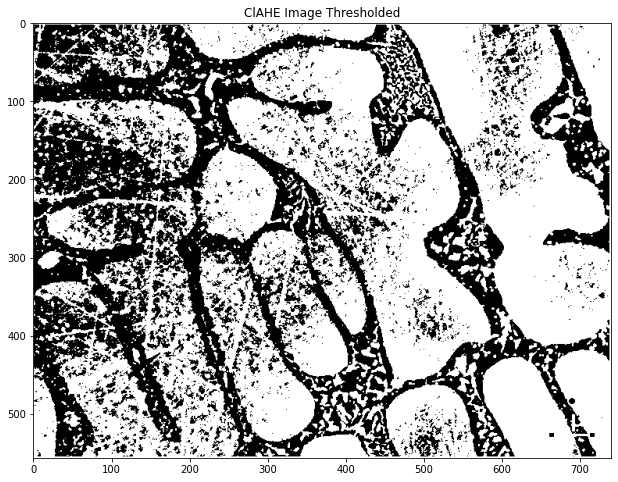

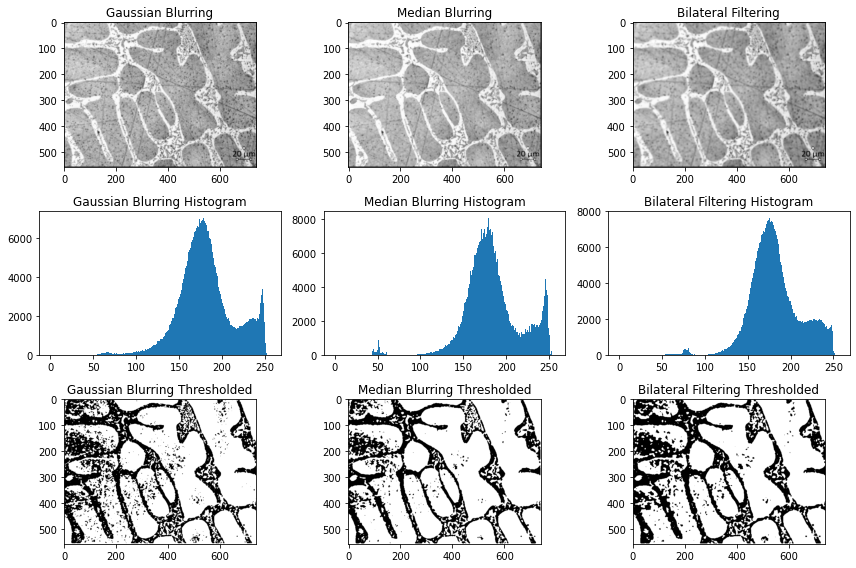

In [126]:
### example

image = cv2.imread(img_path)
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
clahe_img = clahe.apply(gray)


print('Original without any denoising')
binary=otsu_thresholding_plot(clahe_img) ## this is self-defined function that returns the thresholded image and the gray image
plt.figure(figsize=(12,8))
plt.imshow(binary,cmap='gray')
plt.title('ClAHE Image Thresholded')
print('After applying different denoising techniques')
# gaussian blurring
blurred = cv2.GaussianBlur(clahe_img, (5, 5), 0)
# median blurring
median = cv2.medianBlur(clahe_img, 5)
# bilateral filtering
bilateral = cv2.bilateralFilter(clahe_img, 9, 75, 75)
plt.figure(figsize=(12,8))
plt.subplot(331)
plt.imshow(blurred,cmap='gray')
plt.title('Gaussian Blurring')
plt.subplot(332)
plt.imshow(median,cmap='gray')
plt.title('Median Blurring')
plt.subplot(333)
plt.imshow(bilateral,cmap='gray')
plt.title('Bilateral Filtering')
plt.subplot(334)
plt.hist(blurred.ravel(),256,[0,256])
plt.title('Gaussian Blurring Histogram')
plt.subplot(335)
plt.hist(median.ravel(),256,[0,256])
plt.title('Median Blurring Histogram')
plt.subplot(336)
plt.hist(bilateral.ravel(),256,[0,256])
plt.title('Bilateral Filtering Histogram')

## otsu thresholding
plt.subplot(337)
binary_blurred=otsu_thresholding_plot(blurred)
plt.imshow(binary_blurred,cmap='gray')
plt.title('Gaussian Blurring Thresholded')
plt.subplot(338)
binary_median=otsu_thresholding_plot(median)
plt.imshow(binary_median,cmap='gray')
plt.title('Median Blurring Thresholded')
plt.subplot(339)
binary_bilateral=otsu_thresholding_plot(bilateral)
plt.imshow(binary_bilateral,cmap='gray')
plt.title('Bilateral Filtering Thresholded')
plt.tight_layout()





# a = np.histogram(gray.ravel(),256,[0,256])[0]
# plot = plt.figure(figsize=(10,5))
# plt.subplot(121)
# plt.imshow(gray,cmap='gray')
# plt.title('Gray Image')
# plt.subplot(122)
# plt.plot(a,label='histogram')


### simple code for the adaptive threshold

One additional method introduce: adaptive threshold

BK not good, NP.
Where there's a will, there's a way, so adaptive threshold by calculating the threshold for a small region of the image, rather than using a global threshold value for the entire image. This approach allows the algorithm to account for variations in lighting across different parts of the image.

Area fraction: 0.37


Text(0.5, 1.0, 'Adaptive Thresholding Image B3-10um-50x.PNG')

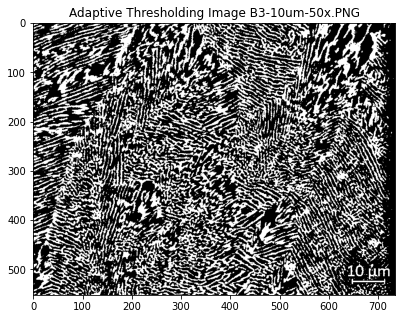

In [127]:

# Read the image
img_path = 'mutiple/B3-10um-50x.PNG'
image = cv2.imread(img_path)  # Replace with your image path

# Convert to grayscale image
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply adaptive thresholding. The parameters blockSize and C need to be adjusted according to the image
# blockSize: Size of the neighborhood (odd number, e.g., 11)
# C: Constant to be subtracted from the mean or weighted mean (e.g., 2)
adaptive_thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, 
                                        cv2.THRESH_BINARY_INV, 57, 2)

area_fraction = cv2.countNonZero(adaptive_thresh) / adaptive_thresh.size
print(f"Area fraction: {area_fraction:.2f}")


plt.figure(figsize=(10,5))
plt.imshow(adaptive_thresh,cmap='gray')
plt.title('Adaptive Thresholding Image B3-10um-50x.PNG')

Dark pixels: 243360
White pixels: 162912
Ratio (dark/white): 0.60
Otsu's thresholding value: 116.0
Dark pixels: 232161
White pixels: 174111
Ratio (dark/white): 0.57
Otsu's thresholding value: 122.0
adaptive thresholding area fraction: 0.37


Text(0.5, 1.0, 'Adaptive Thresholding Image')

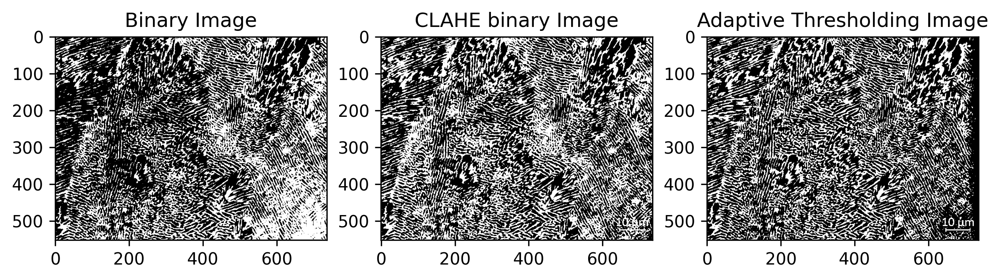

In [128]:

### comparision:
binary = otsu_thresholding_plot(gray)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
clahe_img = clahe.apply(gray)
clahe_binary=otsu_thresholding_plot(clahe_img)
print(f'adaptive thresholding area fraction: {cv2.countNonZero(adaptive_thresh) / adaptive_thresh.size:.2f}')
plt.figure(figsize=(10,8),dpi=300)
plt.subplot(131)
plt.imshow(binary,cmap='gray')
plt.title('Binary Image')
plt.subplot(132)
plt.imshow(clahe_binary,cmap='gray')
plt.title('CLAHE binary Image')
plt.subplot(133)
plt.imshow(adaptive_thresh,cmap='gray')
plt.title('Adaptive Thresholding Image')

Area fraction: 0.58
Dark pixels: 127266
White pixels: 281401
Ratio (dark/white): 0.31
Otsu's thresholding value: 176.0
Dark pixels: 139234
White pixels: 269433
Ratio (dark/white): 0.34
Otsu's thresholding value: 148.0
adaptive thresholding area fraction: 0.58


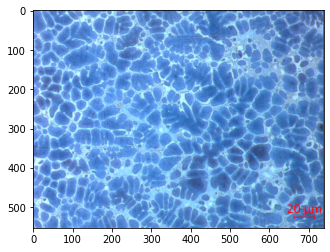

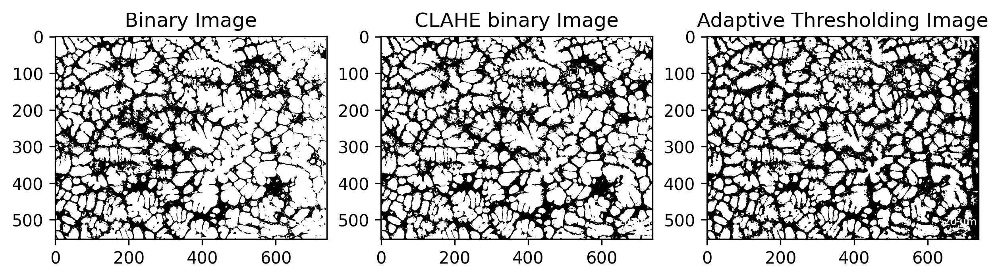

In [129]:
### another good example
plt.imshow(cv2.imread('mutiple/B4-20um-20x.PNG'))
compare_between_bi_clahebi_adaptive('mutiple/B4-20um-20x.PNG')

### Why not always adaptive threshold
What a beautiful extraction!

Not hard to find adaptive thresholding method is extract more detail structure automatically, and no additional pretreatment is needed. So far so good, this method looks so idea, right? 

As Gul’dan says long time ago: “What is the price?"

Check the example below:

Area fraction: 0.35
Dark pixels: 289949
White pixels: 123159
Ratio (dark/white): 0.70
Otsu's thresholding value: 134.0
Dark pixels: 139702
White pixels: 273406
Ratio (dark/white): 0.34
Otsu's thresholding value: 147.0
adaptive thresholding area fraction: 0.35


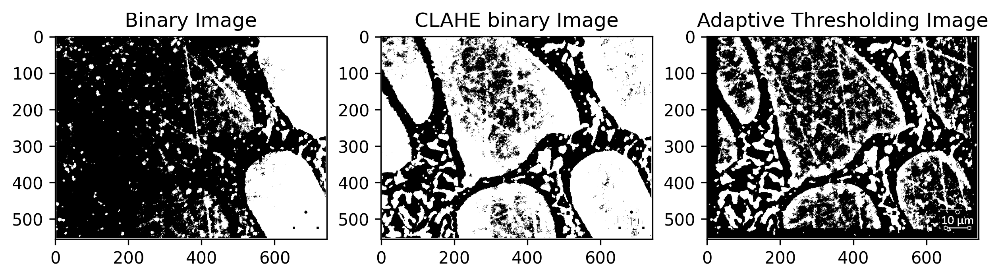

In [135]:
# Read the image
img_path = 'mutiple/A8-10um-50x.PNG'
compare_between_bi_clahebi_adaptive(img_path)

What did you find? Do you see the false positive region in the adaptive threshold method? Think about why this happens.

## it's time to program a simple function to solve our image binary problem 

- hope you get the idea for each step so far, lets wrap them into a function we can use for real tasts

In [142]:
def image_process_area(file_path: str,method='binary'):
    ## method could be 'binary' or 'adaptive'
    store_name = file_path.split('/')[-1].split('.')[0]
    # Load the image
    image = cv2.imread(file_path) 
    img_blur = cv2.medianBlur(image,5)

    # Convert to grayscale
    gray = cv2.cvtColor(img_blur, cv2.COLOR_BGR2GRAY)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    clahe_img = clahe.apply(gray)
    

    # Apply a binary threshold to distinguish dark and white regions
    if method == 'binary':
    # Experiment with the threshold value (e.g., 127) to find a good distinction
        _, thresholded = cv2.threshold(clahe_img, 0, 255, cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
    if method == 'adaptive':
        # Apply adaptive thresholding. The parameters blockSize and C need to be adjusted according to the image
        # blockSize: Size of the neighborhood (odd number, e.g., 11)
        # C: Constant to be subtracted from the mean or weighted mean (e.g., 2) 
        thresholded = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
                                            cv2.THRESH_BINARY_INV,67, 2)

    # Count the number of white and dark pixels
    white_pixels = cv2.countNonZero(thresholded)
    dark_pixels = thresholded.size - white_pixels

    # Calculate the ratio
    ratio = dark_pixels / (white_pixels+dark_pixels) if white_pixels != 0 else 0

    # Display the results
    with open(f'output_{method}.txt', 'a') as f:
        f.write(f"File: {store_name}\n")
        f.write(f"Dark pixels: {dark_pixels}\n")
        f.write(f"White pixels: {white_pixels}\n")
        f.write(f"Ratio (dark/white): {ratio:.2f}\n")
    print(f"Dark pixels: {dark_pixels}")
    print(f"White pixels: {white_pixels}")
    print(f"Ratio (dark/white): {ratio:.2f}")

    stackImage = stackImages(0.6, ([image, gray, thresholded]))
    cv2.imwrite(f'{store_name}_{method}.png',thresholded)
    plt.figure(figsize=(10,5))
    plt.imshow(stackImage)

./mutiple/A1-20um-20x.PNG
Dark pixels: 246730
White pixels: 161750
Ratio (dark/white): 0.60
Dark pixels: 221247
White pixels: 187233
Ratio (dark/white): 0.54
./mutiple/A8-10um-50x.PNG
Dark pixels: 285651
White pixels: 127457
Ratio (dark/white): 0.69
Dark pixels: 126395
White pixels: 286713
Ratio (dark/white): 0.31
./mutiple/B9-10um-50x.PNG
Dark pixels: 277843
White pixels: 133225
Ratio (dark/white): 0.68
Dark pixels: 263096
White pixels: 147972
Ratio (dark/white): 0.64
./mutiple/C9-20um-20x.PNG
Dark pixels: 318087
White pixels: 90765
Ratio (dark/white): 0.78
Dark pixels: 330503
White pixels: 78349
Ratio (dark/white): 0.81
./mutiple/B3-10um-50x.PNG
Dark pixels: 270316
White pixels: 135956
Ratio (dark/white): 0.67
Dark pixels: 202675
White pixels: 203597
Ratio (dark/white): 0.50
./mutiple/B4-10um-50x.PNG
Dark pixels: 187582
White pixels: 223484
Ratio (dark/white): 0.46
Dark pixels: 100521
White pixels: 310545
Ratio (dark/white): 0.24
./mutiple/B2-10um-50x.PNG
Dark pixels: 334679
White pi

/Users/lianbin/anaconda3/envs/opencv/lib/python3.7/site-packages/ipykernel_launcher.py:44: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Dark pixels: 346370
White pixels: 63775
Ratio (dark/white): 0.84
Dark pixels: 354026
White pixels: 56119
Ratio (dark/white): 0.86
./mutiple/A4-20um-20x.PNG
Dark pixels: 352578
White pixels: 56274
Ratio (dark/white): 0.86
Dark pixels: 279896
White pixels: 128956
Ratio (dark/white): 0.68
./mutiple/B2-20um-20x.PNG
Dark pixels: 322946
White pixels: 87568
Ratio (dark/white): 0.79
Dark pixels: 398332
White pixels: 12182
Ratio (dark/white): 0.97


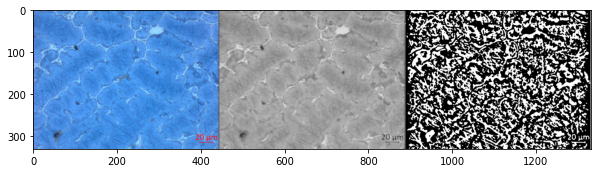

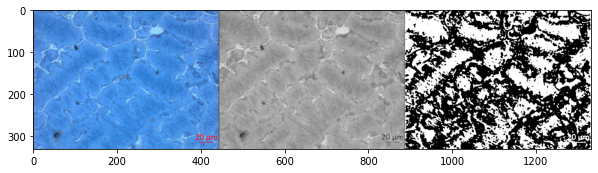

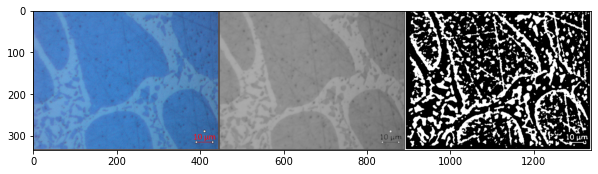

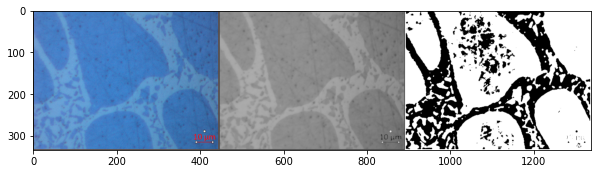

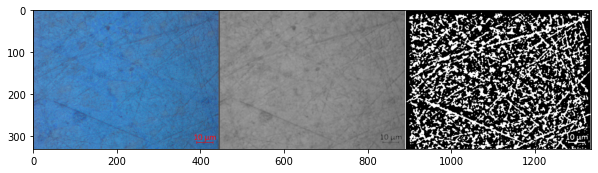

...

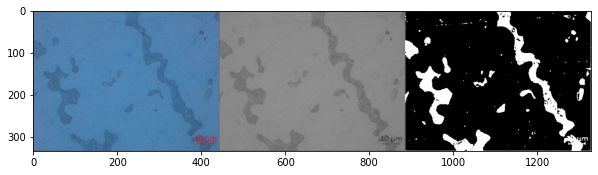

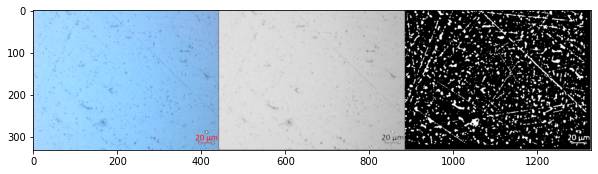

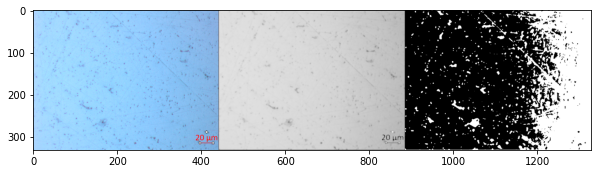

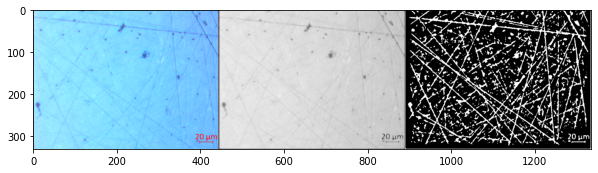

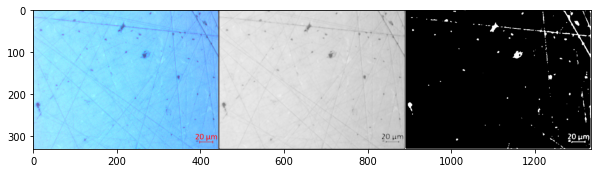

In [144]:
import os

files = os.walk('./mutiple/')
for root, dirs, files in files:
    for file in files:
        if file.endswith('.PNG'):
            file_path = os.path.join(root, file)
            print(file_path)
            image_process_area(file_path,method='adaptive')
            image_process_area(file_path,method='binary')


### In the end
Hope you enjoy this tutorial, if you have any question welcome to shot a email to me, you should now have certain awareness of img processing and get some hand on experience of opencv 

Proccessed results is stored in the same folder 
- ratio data in output_{method}.txt
- Processed images

- email: bin_lian @ utexas.edu
- homepage: bin-lian.me
- office hour for 2024 fall : Fri 4-6 (1hr late than before, due to group meeting.)